In [76]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split


In [77]:
df=pd.read_csv("Data/Raw/ground_vibration_dataset.csv")

In [78]:
df.head()

,Timestamp,Blast_ID,Charge_Weight(kg),Burden(m),Spacing(m),Delay(ms),Soil_Type,Temperature(°C),Wind_Speed(m/s),Seismometer(m/s²),Geophone(mm/s),Acc_X(m/s²),Acc_Y(m/s²),Acc_Z(m/s²),PSD_Value,PPV(mm/s),Frequency(Hz),Vibration_Level
0,2024-01-01 00:00:00,B0001,218.543053,2.740532,4.046823,46,Soft,29.700504,2.372175,2.418452,2.652784,0.026725,0.068236,0.065095,0.295711,0.833777,37.051200,Low
1,2024-01-01 00:01:00,B0002,477.821438,4.167604,3.987915,17,Medium,27.202158,1.668883,0.413523,0.695846,0.098019,0.051785,0.024989,0.296163,4.964773,21.914778,High
2,2024-01-01 00:02:00,B0003,379.397274,5.491783,6.625018,16,Soft,24.763554,2.896567,0.992408,0.681437,0.099486,0.054579,0.057577,0.074003,3.450173,46.747953,Medium
3,2024-01-01 00:03:00,B0004,319.396318,4.928900,3.998185,23,Medium,17.663643,4.445003,0.162014,2.625794,0.060006,0.048492,0.063110,0.229370,2.939434,9.250567,Medium
4,2024-01-01 00:04:00,B0005,120.208388,5.226245,4.087799,12,Hard,20.226660,2.846525,0.632271,1.032125,0.025313,0.096042,0.036824,0.171830,3.944743,21.686189,Medium


In [79]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 18 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Timestamp          1000 non-null   object 
 1   Blast_ID           1000 non-null   object 
 2   Charge_Weight(kg)  1000 non-null   float64
 3   Burden(m)          1000 non-null   float64
 4   Spacing(m)         1000 non-null   float64
 5   Delay(ms)          1000 non-null   int64  
 6   Soil_Type          1000 non-null   object 
 7   Temperature(°C)    1000 non-null   float64
 8   Wind_Speed(m/s)    1000 non-null   float64
 9   Seismometer(m/s²)  1000 non-null   float64
 10  Geophone(mm/s)     1000 non-null   float64
 11  Acc_X(m/s²)        1000 non-null   float64
 12  Acc_Y(m/s²)        1000 non-null   float64
 13  Acc_Z(m/s²)        1000 non-null   float64
 14  PSD_Value          1000 non-null   float64
 15  PPV(mm/s)          1000 non-null   float64
 16  Frequency(Hz)      1000 n

In [80]:
df.isnull().sum()

Timestamp            0
Blast_ID             0
Charge_Weight(kg)    0
Burden(m)            0
Spacing(m)           0
Delay(ms)            0
Soil_Type            0
Temperature(°C)      0
Wind_Speed(m/s)      0
Seismometer(m/s²)    0
Geophone(mm/s)       0
Acc_X(m/s²)          0
Acc_Y(m/s²)          0
Acc_Z(m/s²)          0
PSD_Value            0
PPV(mm/s)            0
Frequency(Hz)        0
Vibration_Level      0
dtype: int64

In [81]:
df.describe()

,Charge_Weight(kg),Burden(m),Spacing(m),Delay(ms),Temperature(°C),Wind_Speed(m/s),Seismometer(m/s²),Geophone(mm/s),Acc_X(m/s²),Acc_Y(m/s²),Acc_Z(m/s²),PSD_Value,PPV(mm/s),Frequency(Hz)
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,270.615449,4.028069,5.009623,29.709000,24.956627,2.492260,1.271533,1.706891,0.054684,0.054618,0.055871,0.274596,2.723641,27.310979
std,131.461813,1.168760,1.162697,11.431579,5.752257,1.448768,0.687957,0.720086,0.025107,0.025866,0.025672,0.133383,1.307562,13.424796
min,52.084410,2.012873,3.000047,10.000000,15.004541,0.019592,0.100578,0.500607,0.010005,0.010022,0.010221,0.050071,0.505416,5.063820
25%,156.187970,2.964297,4.045404,20.000000,20.104446,1.221975,0.677374,1.075107,0.034121,0.032178,0.034574,0.158137,1.560034,15.185534
50%,273.563319,4.074936,5.002456,30.000000,24.667302,2.506865,1.245107,1.690141,0.054635,0.054437,0.055905,0.268927,2.712694,26.943774
75%,384.943815,5.041860,6.036414,39.000000,29.989841,3.727216,1.875744,2.318108,0.075333,0.076940,0.077984,0.397353,3.824798,39.617069
max,499.872953,5.997655,6.991283,49.000000,34.975859,4.997303,2.498098,2.993557,0.099876,0.099955,0.099971,0.499701,4.994802,49.923642


In [82]:
# Assigning timestamp type to timestamp column
df['Timestamp'] = pd.to_datetime(df['Timestamp'], errors='coerce')

In [83]:
print(f"Soil Types {df["Soil_Type"].unique()}")
print(f"Vibration levels {df["Vibration_Level"].unique()}"	)

Soil Types ['Soft' 'Medium' 'Hard']
Vibration levels ['Low' 'High' 'Medium']


In [84]:
# mapping categorical values
Soil_Type_mapping={"Soft":0,"Medium":1,"Hard":2}
Vib_level_mapping={"Low":0,"Medium":1,"High":2}
df["Soil_Type_encoded"]=df["Soil_Type"].map(Soil_Type_mapping)
df["Vibration_Level_encoded"]=df["Vibration_Level"].map(Vib_level_mapping)


In [85]:
df.head()

,Timestamp,Blast_ID,Charge_Weight(kg),Burden(m),Spacing(m),Delay(ms),Soil_Type,Temperature(°C),Wind_Speed(m/s),Seismometer(m/s²),Geophone(mm/s),Acc_X(m/s²),Acc_Y(m/s²),Acc_Z(m/s²),PSD_Value,PPV(mm/s),Frequency(Hz),Vibration_Level,Soil_Type_encoded,Vibration_Level_encoded
0,2024-01-01 00:00:00,B0001,218.543053,2.740532,4.046823,46,Soft,29.700504,2.372175,2.418452,2.652784,0.026725,0.068236,0.065095,0.295711,0.833777,37.051200,Low,0,0
1,2024-01-01 00:01:00,B0002,477.821438,4.167604,3.987915,17,Medium,27.202158,1.668883,0.413523,0.695846,0.098019,0.051785,0.024989,0.296163,4.964773,21.914778,High,1,2
2,2024-01-01 00:02:00,B0003,379.397274,5.491783,6.625018,16,Soft,24.763554,2.896567,0.992408,0.681437,0.099486,0.054579,0.057577,0.074003,3.450173,46.747953,Medium,0,1
3,2024-01-01 00:03:00,B0004,319.396318,4.928900,3.998185,23,Medium,17.663643,4.445003,0.162014,2.625794,0.060006,0.048492,0.063110,0.229370,2.939434,9.250567,Medium,1,1
4,2024-01-01 00:04:00,B0005,120.208388,5.226245,4.087799,12,Hard,20.226660,2.846525,0.632271,1.032125,0.025313,0.096042,0.036824,0.171830,3.944743,21.686189,Medium,2,1


In [86]:
# Function to draw plots and return skewness
def draw_graphs(feature, message):
    if feature not in df.columns:
        print(f"Feature '{feature}' not found in DataFrame.")
        return

    plt.figure(figsize=(12,5))

    # Box Plot
    plt.subplot(1, 2, 1)
    sns.boxplot(x=df[feature], color='skyblue')
    plt.title(f"Boxplot of {feature} {message}")

    # Histogram
    plt.subplot(1, 2, 2)
    sns.histplot(df[feature], kde=True, color='teal', bins=20)
    plt.title(f"Histogram of {feature} {message}")

    plt.tight_layout()
    plt.show()

    # Skewness
    sk = df[feature].skew()
    print(f"Skewness of {feature} {message}: {sk:.3f}")
    return sk

In [87]:
df.columns

Index(['Timestamp', 'Blast_ID', 'Charge_Weight(kg)', 'Burden(m)', 'Spacing(m)',
       'Delay(ms)', 'Soil_Type', 'Temperature(°C)', 'Wind_Speed(m/s)',
       'Seismometer(m/s²)', 'Geophone(mm/s)', 'Acc_X(m/s²)', 'Acc_Y(m/s²)',
       'Acc_Z(m/s²)', 'PSD_Value', 'PPV(mm/s)', 'Frequency(Hz)',
       'Vibration_Level', 'Soil_Type_encoded', 'Vibration_Level_encoded'],
      dtype='object')

In [88]:
features=['Charge_Weight(kg)', 'Burden(m)', 'Spacing(m)',
       'Delay(ms)', 'Soil_Type_encoded', 'Temperature(°C)', 'Wind_Speed(m/s)',
       'Seismometer(m/s²)', 'Geophone(mm/s)', 'Acc_X(m/s²)', 'Acc_Y(m/s²)',
       'Acc_Z(m/s²)', 'PSD_Value', 'PPV(mm/s)', 'Frequency(Hz)']

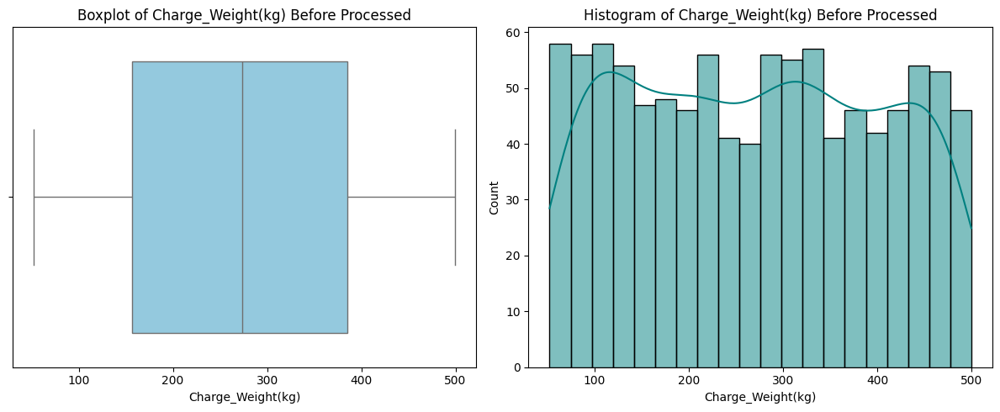

Skewness of Charge_Weight(kg) Before Processed: 0.039


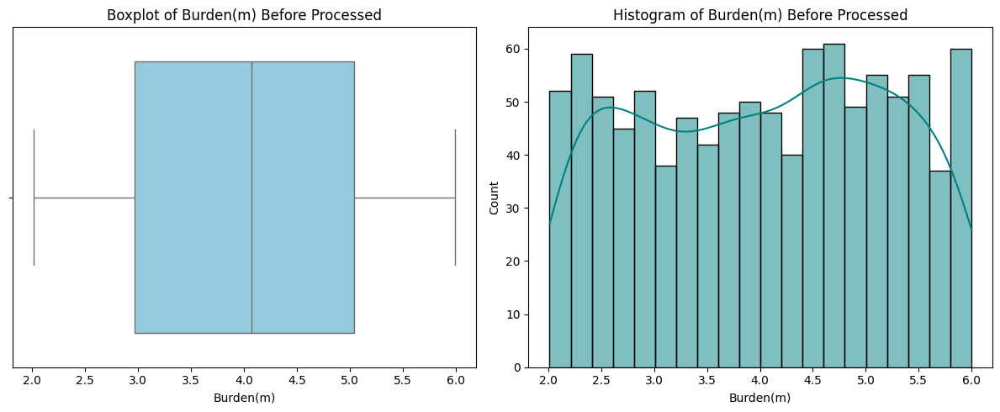

Skewness of Burden(m) Before Processed: -0.059


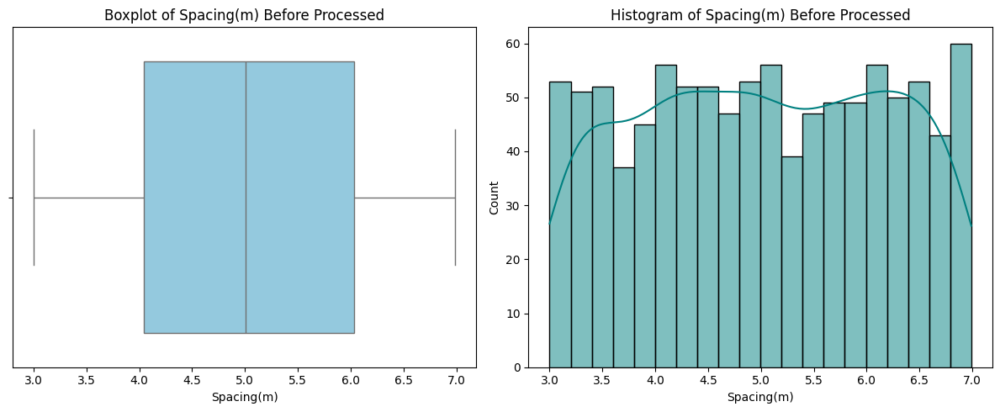

Skewness of Spacing(m) Before Processed: -0.022


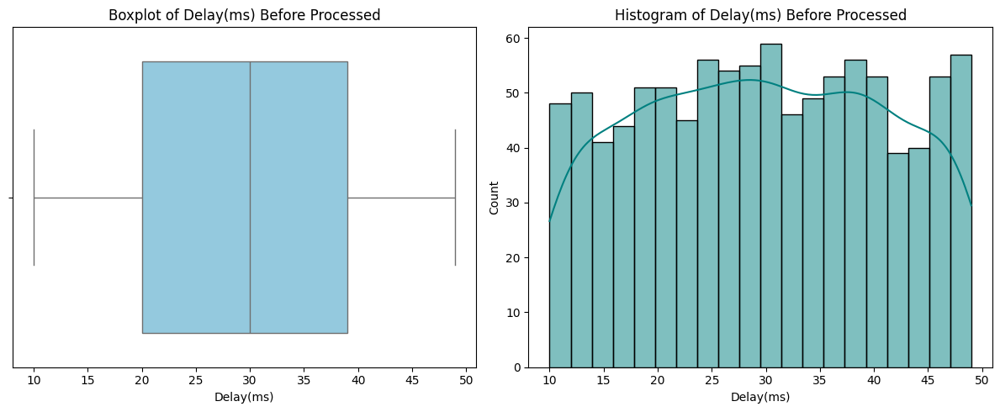

Skewness of Delay(ms) Before Processed: -0.003


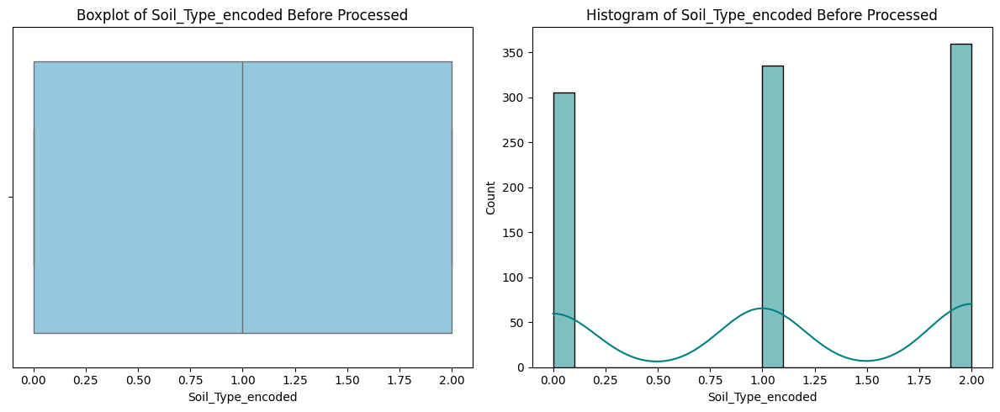

Skewness of Soil_Type_encoded Before Processed: -0.101


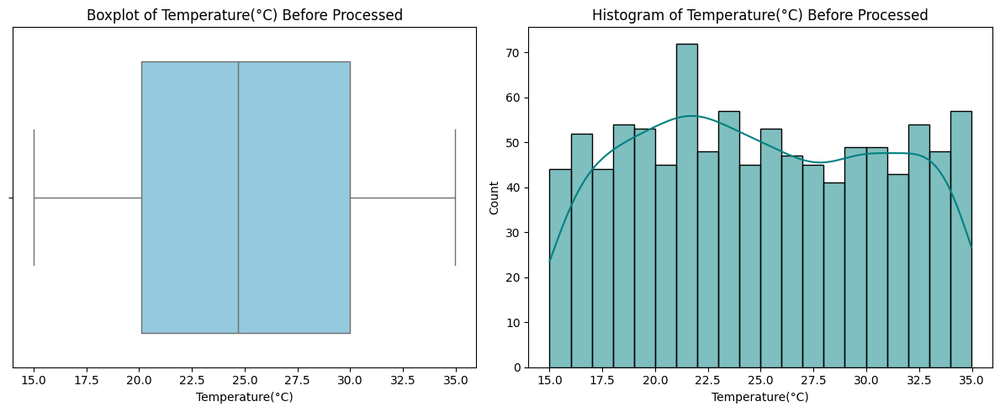

Skewness of Temperature(°C) Before Processed: 0.060


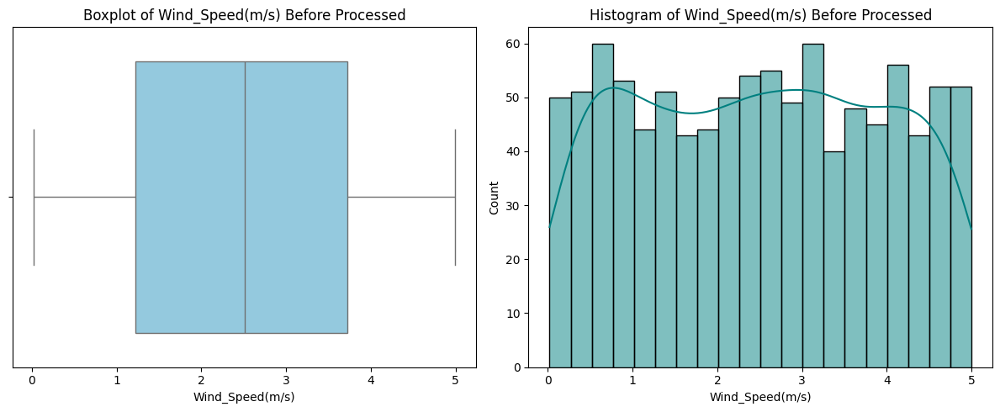

Skewness of Wind_Speed(m/s) Before Processed: 0.013


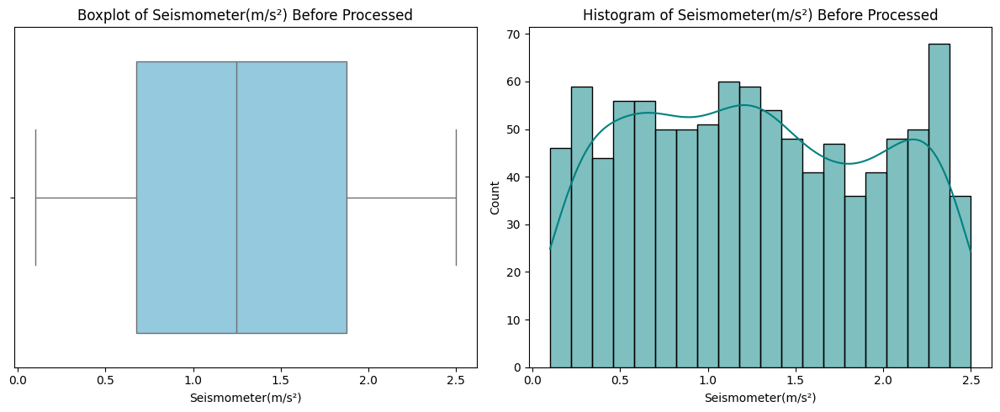

Skewness of Seismometer(m/s²) Before Processed: 0.086


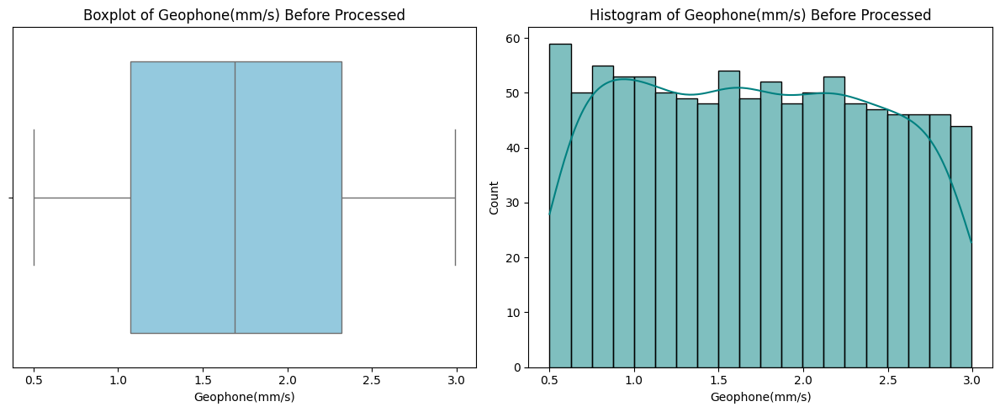

Skewness of Geophone(mm/s) Before Processed: 0.052


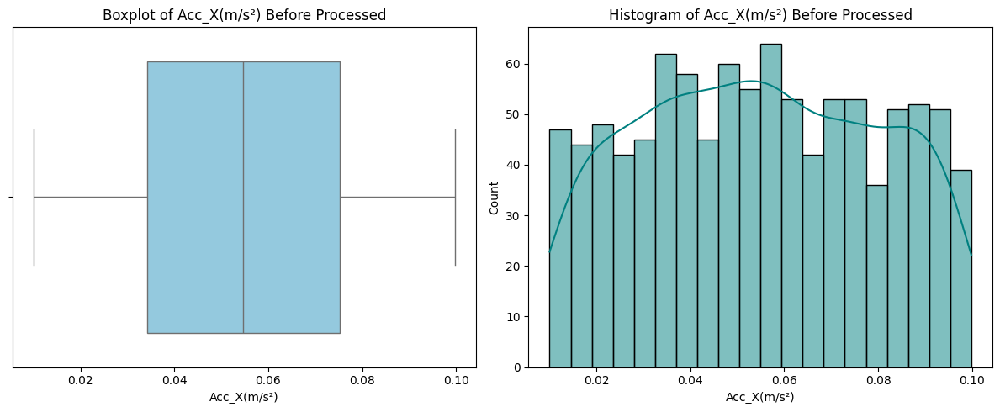

Skewness of Acc_X(m/s²) Before Processed: 0.020


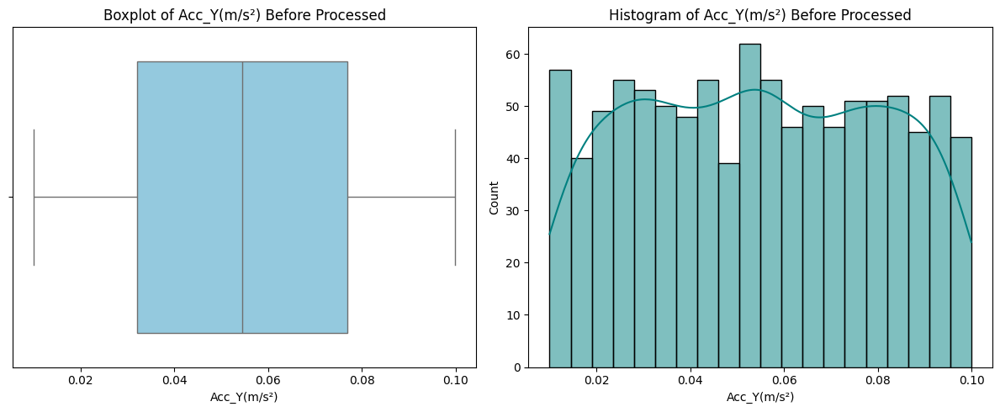

Skewness of Acc_Y(m/s²) Before Processed: 0.012


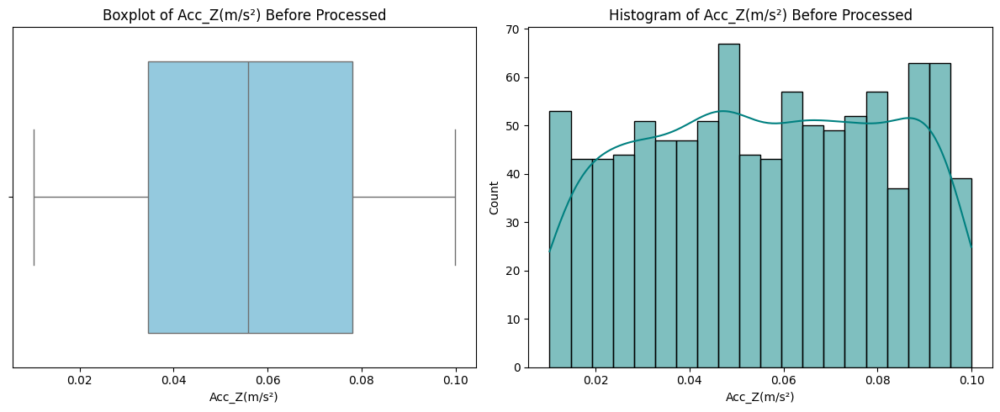

Skewness of Acc_Z(m/s²) Before Processed: -0.049


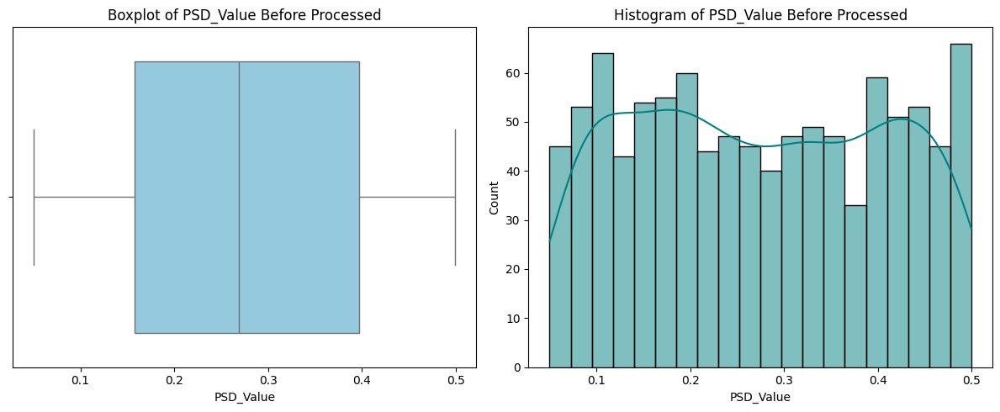

Skewness of PSD_Value Before Processed: 0.043


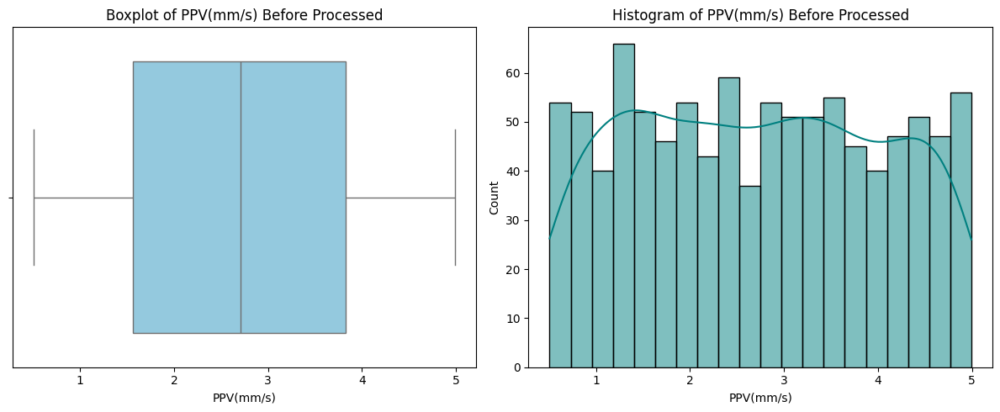

Skewness of PPV(mm/s) Before Processed: 0.037


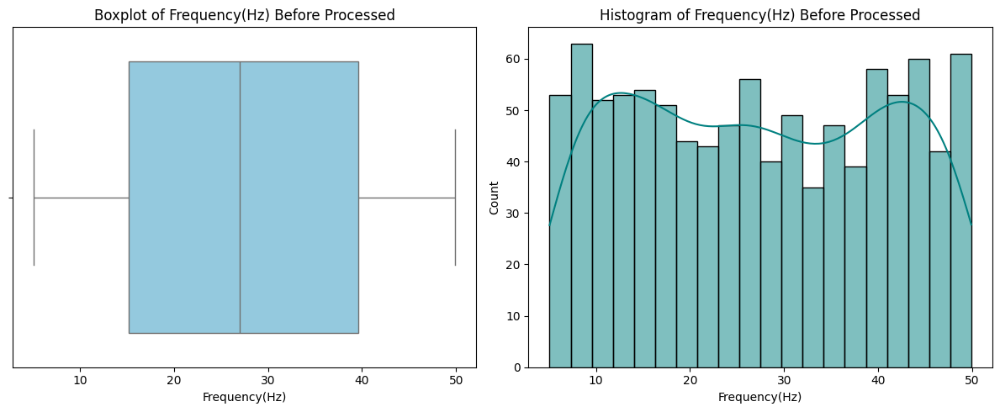

Skewness of Frequency(Hz) Before Processed: 0.036


In [89]:
for feature in features:
    sk = draw_graphs(feature, "Before Processed")  # draw before transformation
    

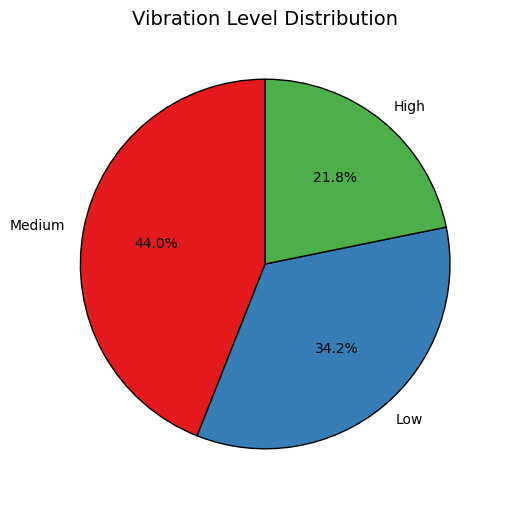

In [90]:
# Pie chart for Rockburst Intensity Levels
plt.figure(figsize=(6,6))
df['Vibration_Level'].value_counts().plot(
    kind='pie',
    autopct='%1.1f%%',
    startangle=90,
    colors=sns.color_palette('Set1'),
    wedgeprops={'edgecolor': 'black'}
)

plt.title("Vibration Level Distribution", fontsize=14)
plt.ylabel("")  
plt.show()


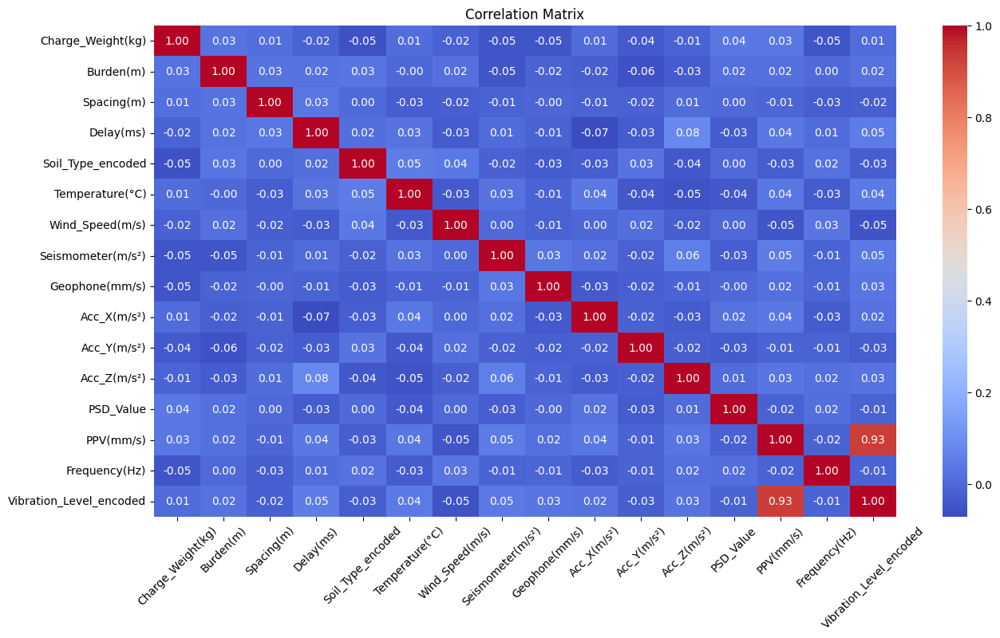

In [91]:
columns=features
columns.append("Vibration_Level_encoded")
plt.figure(figsize=(15,8))
sns.heatmap(df[columns].corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix")
plt.xticks(rotation=45)
plt.show()


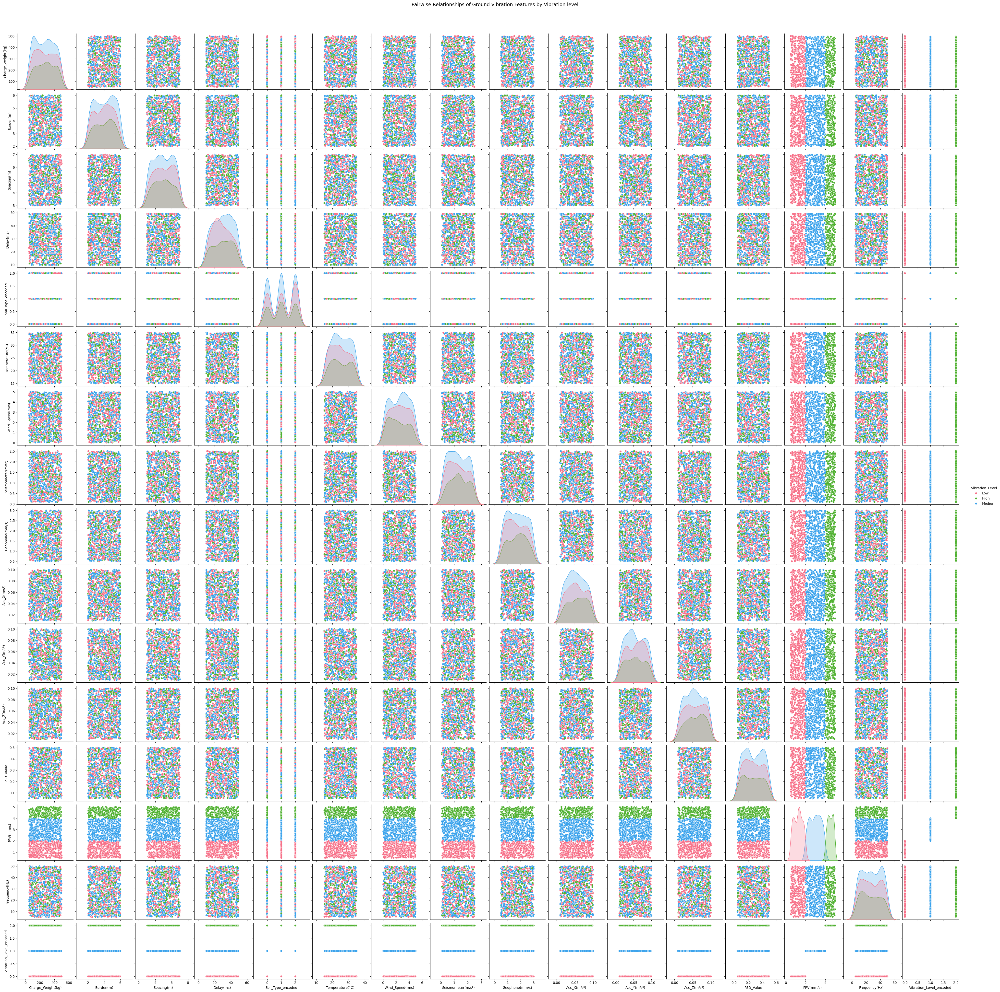

In [92]:
# Create the pairplot
plot = sns.pairplot(df, vars=features, hue='Vibration_Level', palette='husl')

# Add a super title
plot.fig.suptitle("Pairwise Relationships of Ground Vibration Features by Vibration level", 
                  fontsize=14, y=1.02)  # y=1.02 moves the title above the plot

plt.show()

In [93]:
df['year'] = df['Timestamp'].dt.year
df['month'] = df['Timestamp'].dt.month
df['day'] = df['Timestamp'].dt.day
df['hour'] = df['Timestamp'].dt.hour
df['minute'] = df['Timestamp'].dt.minute
df["second"] = df["Timestamp"].dt.second

In [94]:
df.head()

,Timestamp,Blast_ID,Charge_Weight(kg),Burden(m),Spacing(m),Delay(ms),Soil_Type,Temperature(°C),Wind_Speed(m/s),Seismometer(m/s²),...,Frequency(Hz),Vibration_Level,Soil_Type_encoded,Vibration_Level_encoded,year,month,day,hour,minute,second
0,2024-01-01 00:00:00,B0001,218.543053,2.740532,4.046823,46,Soft,29.700504,2.372175,2.418452,...,37.051200,Low,0,0,2024,1,1,0,0,0
1,2024-01-01 00:01:00,B0002,477.821438,4.167604,3.987915,17,Medium,27.202158,1.668883,0.413523,...,21.914778,High,1,2,2024,1,1,0,1,0
2,2024-01-01 00:02:00,B0003,379.397274,5.491783,6.625018,16,Soft,24.763554,2.896567,0.992408,...,46.747953,Medium,0,1,2024,1,1,0,2,0
3,2024-01-01 00:03:00,B0004,319.396318,4.928900,3.998185,23,Medium,17.663643,4.445003,0.162014,...,9.250567,Medium,1,1,2024,1,1,0,3,0
4,2024-01-01 00:04:00,B0005,120.208388,5.226245,4.087799,12,Hard,20.226660,2.846525,0.632271,...,21.686189,Medium,2,1,2024,1,1,0,4,0


In [95]:
# Split data
X = df.drop(columns=['Timestamp','Vibration_Level',"Vibration_Level_encoded","Blast_ID","Soil_Type"])
y = df['Vibration_Level_encoded']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)


Before SMOTE: Vibration_Level_encoded
1    352
0    274
2    174
Name: count, dtype: int64
After SMOTE: Vibration_Level_encoded
0    352
1    352
2    352
Name: count, dtype: int64


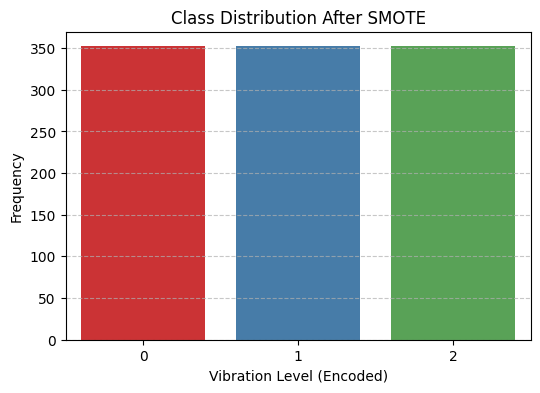

In [96]:
# Apply SMOTE on train set only
smote = SMOTE(random_state=42)
X_train_res, y_train_res = smote.fit_resample(X_train, y_train)

print("Before SMOTE:", y_train.value_counts())
print("After SMOTE:", y_train_res.value_counts())

plt.figure(figsize=(6,4))
sns.countplot(x=y_train_res, palette="Set1",hue=y_train_res,legend=False)
plt.title("Class Distribution After SMOTE")
plt.xlabel("Vibration Level (Encoded)")
plt.ylabel("Frequency")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


In [97]:
train_df=pd.concat([X_train_res,y_train_res],axis=1)

In [98]:
train_df['Timestamp'] = pd.to_datetime(dict(
    year=train_df['year'],
    month=train_df['month'],
    day=train_df['day'],
    hour=train_df.get('hour', 0),
    minute=train_df.get('minute', 0),
    second=train_df.get('second', 0)
))


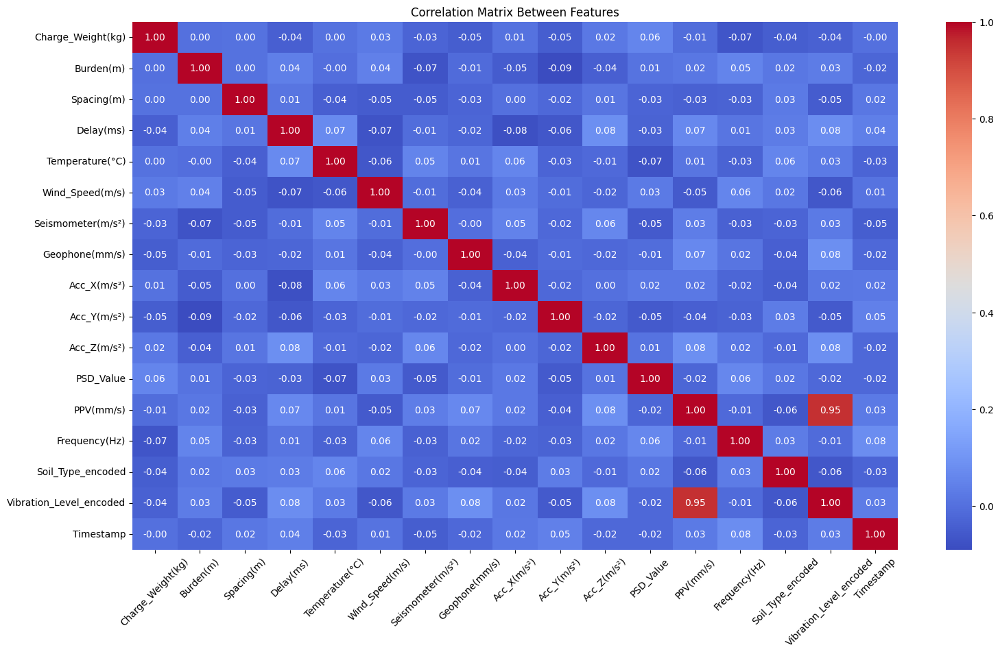

In [99]:
exclude_cols = ["year", "month", "day", "hour", "minute", "second"]
columns = [col for col in train_df.columns if col not in exclude_cols]

plt.figure(figsize=(18, 10))
sns.heatmap(train_df[columns].corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix Between Features")
plt.xticks(rotation=45)
plt.show()


In [102]:
train_df.head(10)

,Charge_Weight(kg),Burden(m),Spacing(m),Delay(ms),Temperature(°C),Wind_Speed(m/s),Seismometer(m/s²),Geophone(mm/s),Acc_X(m/s²),Acc_Y(m/s²),...,Frequency(Hz),Soil_Type_encoded,year,month,day,hour,minute,second,Vibration_Level_encoded,Timestamp
0,102.987987,3.993023,6.808887,13,28.537446,4.408177,0.564273,0.660109,0.073103,0.067760,...,5.948630,1,2024,1,1,15,38,0,0,2024-01-01 15:38:00
1,62.952204,3.644114,4.198263,16,31.103488,4.751396,1.365412,0.939181,0.059241,0.051419,...,22.298402,2,2024,1,1,9,17,0,1,2024-01-01 09:17:00
2,335.088370,3.340475,4.409500,27,31.728844,3.380979,0.702861,2.290813,0.058345,0.095045,...,21.266525,2,2024,1,1,2,42,0,1,2024-01-01 02:42:00
3,170.904812,4.352809,6.226774,31,18.845158,4.941853,0.570962,1.929572,0.093192,0.026867,...,47.799081,2,2024,1,1,15,26,0,2,2024-01-01 15:26:00
4,460.958249,2.158475,5.608897,41,16.947338,0.336423,0.657495,1.445062,0.021446,0.078480,...,31.660045,0,2024,1,1,4,33,0,2,2024-01-01 04:33:00
5,309.329762,3.413006,6.774806,28,24.354412,1.750933,0.480449,2.044236,0.088815,0.088669,...,41.613621,1,2024,1,1,13,22,0,2,2024-01-01 13:22:00
6,182.116330,3.166650,5.049455,31,19.972098,0.873906,0.784448,2.283304,0.090878,0.095273,...,48.997558,2,2024,1,1,4,29,0,1,2024-01-01 04:29:00
7,219.408515,4.589899,3.076464,19,18.309995,4.018467,0.701159,2.598520,0.035799,0.089747,...,42.398798,2,2024,1,1,8,36,0,1,2024-01-01 08:36:00
8,363.492871,2.285027,6.924711,39,15.787238,4.758512,0.354712,0.677290,0.058449,0.038494,...,14.776096,0,2024,1,1,13,18,0,1,2024-01-01 13:18:00
9,200.707527,2.964806,4.380769,40,32.287325,3.987103,2.170650,1.977180,0.050524,0.080859,...,38.895639,1,2024,1,1,12,33,0,0,2024-01-01 12:33:00


In [101]:
train_df.to_csv("Data/Preprocessed/Ground_Vibration_dataset_V1.csv",index=False)